<div style="padding:20px; 
            color:#8EAC69;
            margin:10px;
            font-size:220%;
            text-align:center;
            display:fill;
            border-radius:20px;
            border-width: 5px;
            border-style: solid;
            border-color: #8EAC69;
            background-color:#363F85;
            overflow:hidden;
            font-weight:500">K-Moyennes pour la segmentation d'images</div>

## <font color='#363F85'>Table des matières<font><a class='anchor' id='toc'></a>
- [1. Import des packages](#packages)
- [2. Import de l'image](#data)
- [3. Visualisation et manipulation de l'image](#viz)
- [4. Compression de l'image](#compression)
- [5. Segmentation de l'image](#segmentation)

## <font color=#363F85>1. Import des packages <a class='anchor' id='packages'></a></font>[↑](#toc)

In [75]:
from PIL import Image, ImageOps
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import MiniBatchKMeans
%matplotlib inline

## <font color=#363F85>2. Import de l'image <a class='anchor' id='data'></a></font>[↑](#toc)

In [76]:
dog_image = Image.open('dog.jpg')

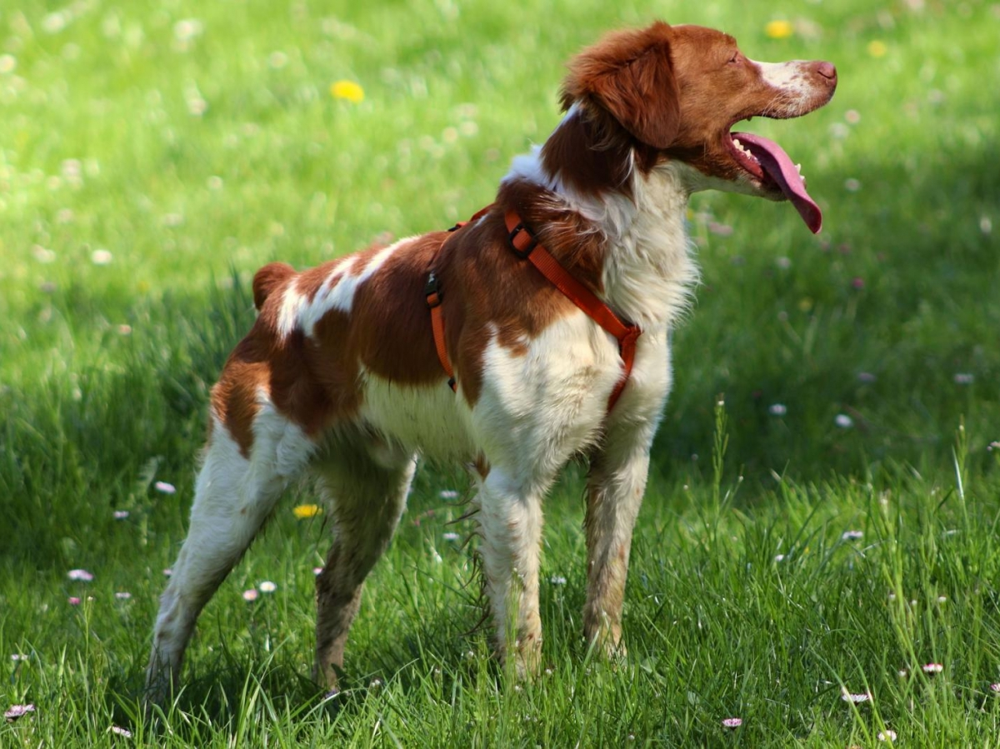

In [77]:
dog_image

## <font color=#363F85>3. Visualisation et manipulation de l'image<a class='anchor' id='viz'></a></font>[↑](#toc)

In [78]:
dog_array = np.array(dog_image)
print('Shape of the Image : ', dog_array.shape)
#hauteur (Nombre de lignes): 432
#largeur (Nombre de colonnes): 768
# RGB: 3 couleurs

Shape of the Image :  (899, 1200, 3)


In [79]:
# Vectorisation de l'image
N_rows, N_cols = dog_array.shape[0], dog_array.shape[1]
image = dog_array.reshape(N_rows * N_cols, 3) #Transformation en matrice 2D avec une ligne = 1 pixel et les colonnes sont R, G, B. 
image = image/255.0 #normalisation
print("taille de l'image", image.shape)
print("4 premiers pixels:\n", image[:4])

taille de l'image (1078800, 3)
4 premiers pixels:
 [[0.65490196 0.78431373 0.37254902]
 [0.65490196 0.78431373 0.37254902]
 [0.64705882 0.78823529 0.37254902]
 [0.64313725 0.78431373 0.36078431]]


In [80]:
# Nombre de couleurs uniques dans l'image
len(np.unique(image,axis=0))

182734

## <font color=#363F85>4. Compression de l'image <a class='anchor' id='compression'></a></font>[↑](#toc)

9 couleurs:


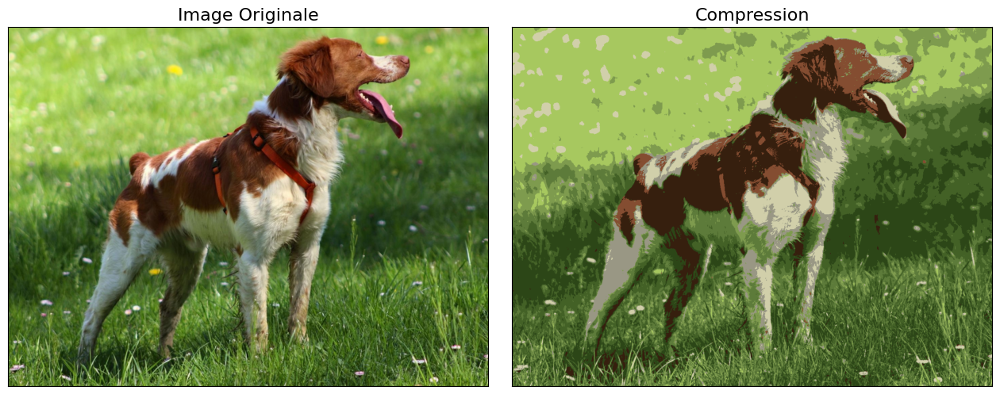

10 couleurs:


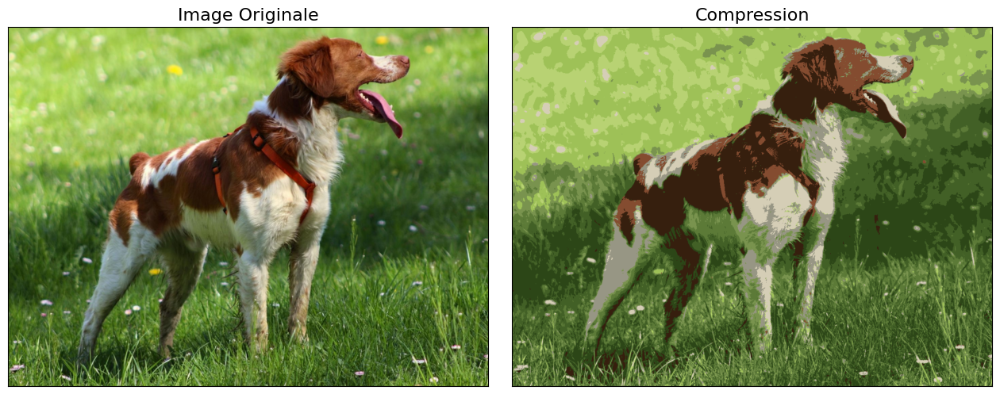

11 couleurs:


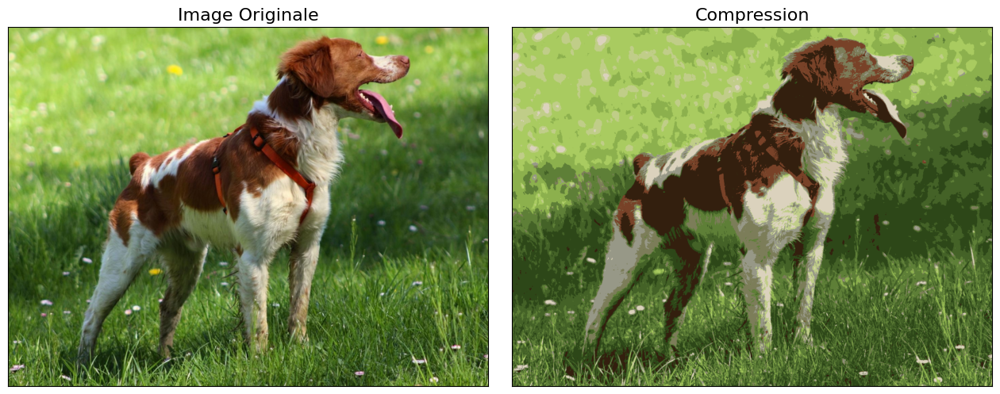

12 couleurs:


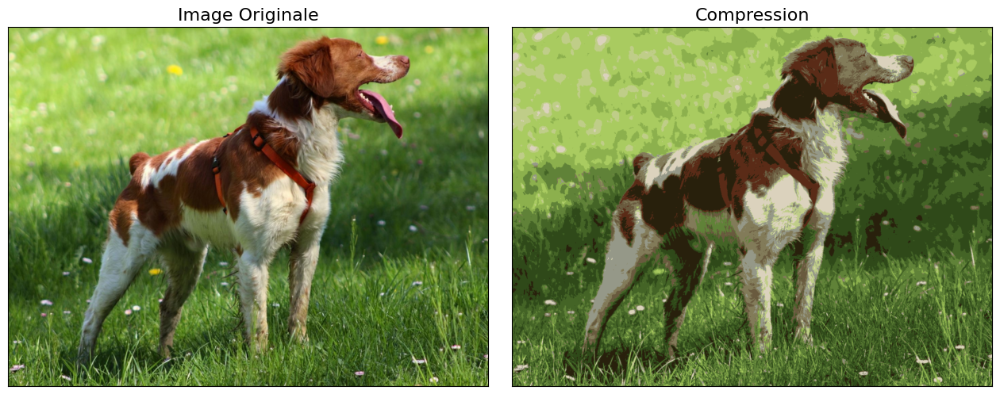

13 couleurs:


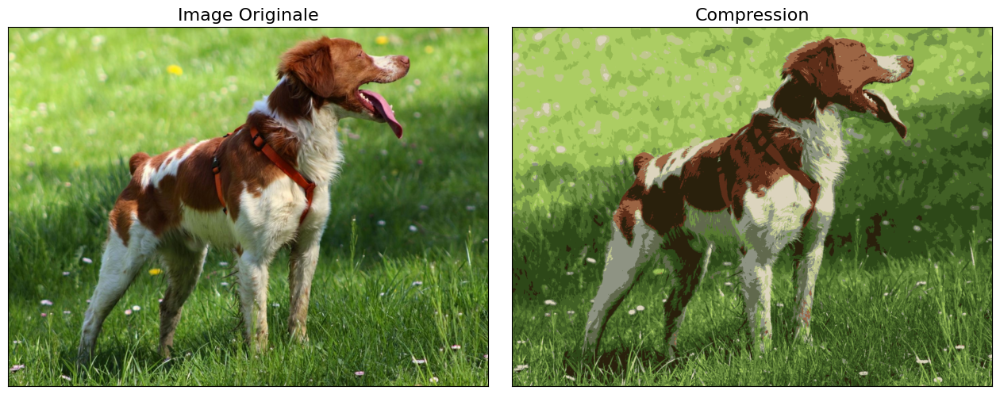

14 couleurs:


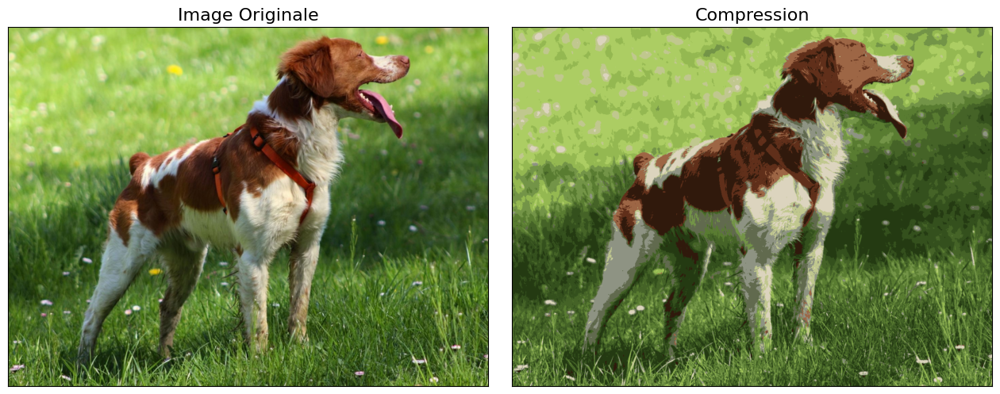

15 couleurs:


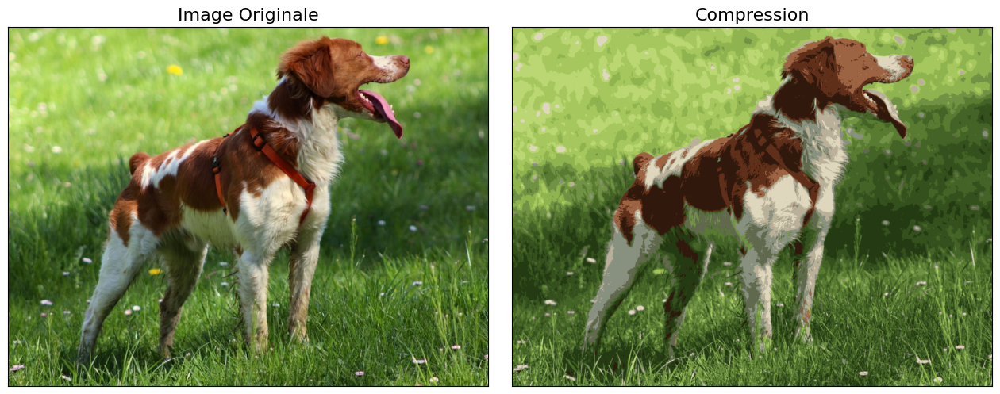

16 couleurs:


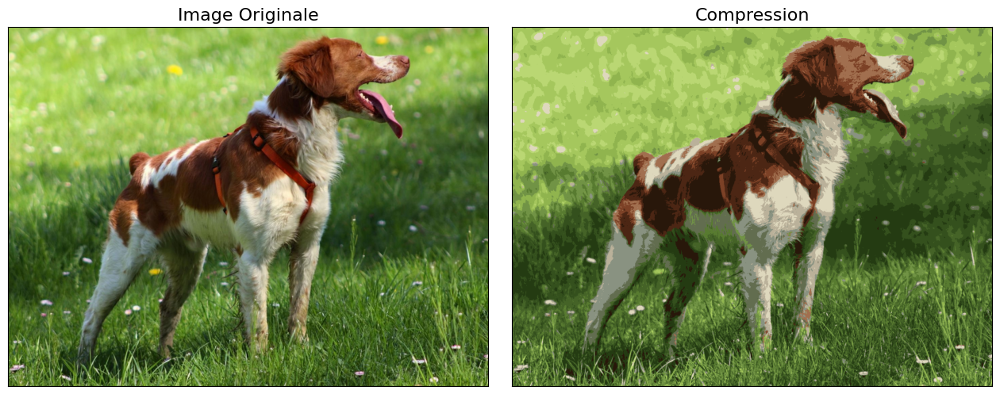

17 couleurs:


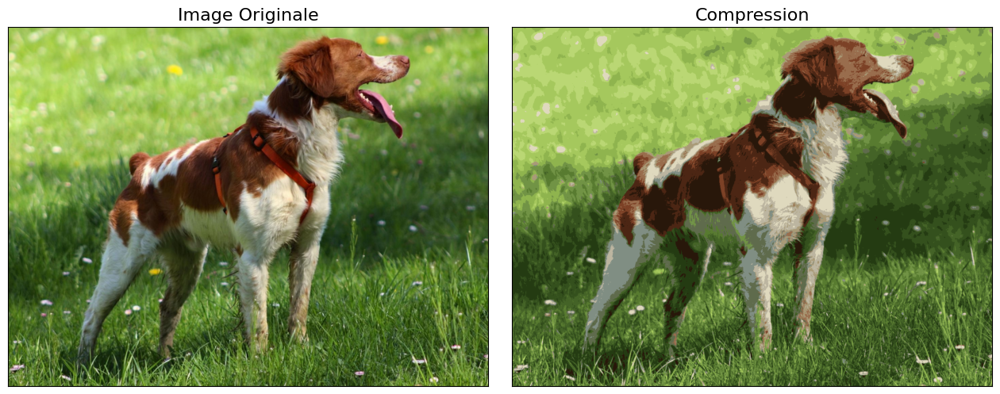

18 couleurs:


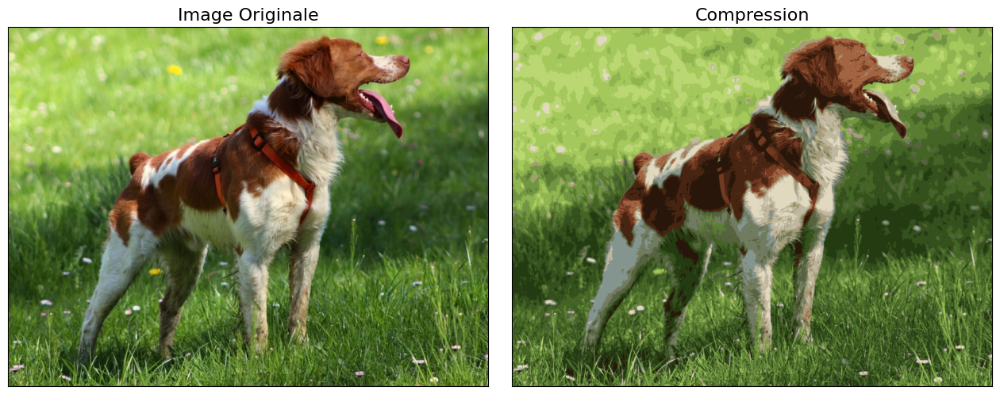

19 couleurs:


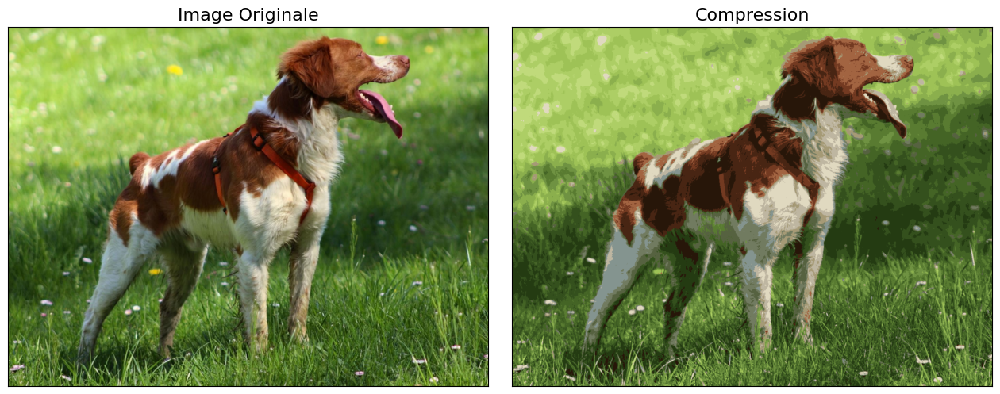

20 couleurs:


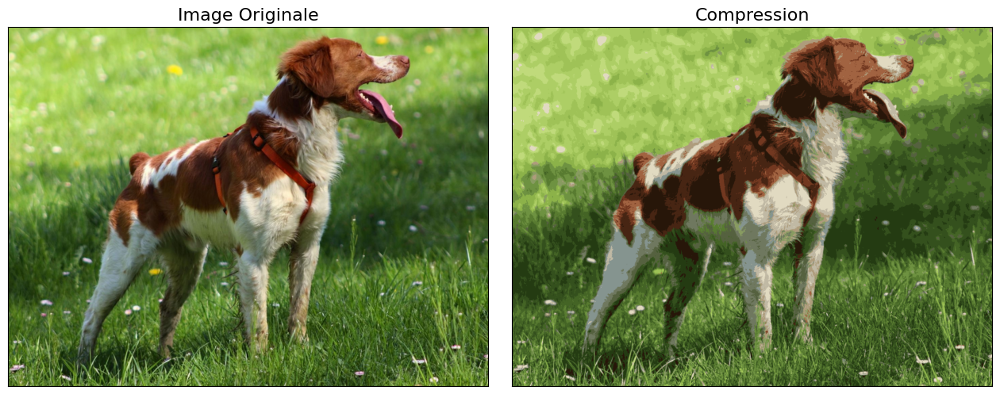

In [81]:
for k in range(9, 21):
    kmeans = MiniBatchKMeans(k, init='k-means++', random_state=42)
    kmeans.fit(image)
    image_compressee = kmeans.cluster_centers_[kmeans.predict(image)]
    print(f"{k} couleurs:")
    image_compressee = afficher_compression(dog_array, kmeans)

C'est pas encore assez beau.

In [82]:
def calculer_taux_compression_couleurs(image_originale, image_compressee):
    """
    Calcule le taux de compression basé sur le nombre de couleurs différentes entre l'image originale et l'image compressée.

    Paramètres :
    image_originale (numpy.ndarray) : Tableau représentant l'image originale.
    image_compressee (numpy.ndarray) : Tableau représentant l'image compressée.

    Retourne :
    float : Taux de compression en pourcentage basé sur le nombre de couleurs.
    """

    # Calculer le nombre de couleurs différentes dans l'image originale
    couleurs_originales = np.unique(image_originale.reshape(-1, 3), axis=0)
    nb_couleurs_originales = len(couleurs_originales)

    # Calculer le nombre de couleurs différentes dans l'image compressée
    couleurs_compressees = np.unique(image_compressee.reshape(-1, 3), axis=0)
    nb_couleurs_compressees = len(couleurs_compressees)

    # Calculer le taux de compression basé sur le nombre de couleurs
    taux_compression_couleurs = (1 - (nb_couleurs_compressees / nb_couleurs_originales)) * 100

    return taux_compression_couleurs

60 couleurs:


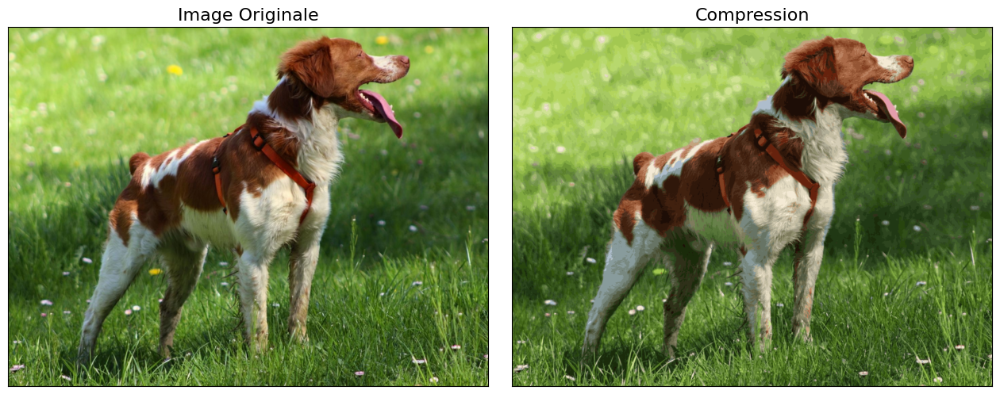

Taux de compression


99.96716538794094

In [100]:
k = 60
kmeans = MiniBatchKMeans(k, init='k-means++', random_state=42)
kmeans.fit(image)
image_compressee = kmeans.cluster_centers_[kmeans.predict(image)]
print(f"{k} couleurs:")
image_compressee = afficher_compression(dog_array, kmeans)
print(f"Taux de compression")
calculer_taux_compression_couleurs(dog_array, image_compressee)

C'est impressionnant, on voit à peine la différence et on a un taux de compression énorme.